# LuciferML | EDA
## Guide

In [1]:
guide = "https://www.kaggle.com/code/d4rklucif3r/body-performance-count-luciferml-eda-models/notebook"

## Make necessary imports

In [2]:
import opendatasets as od
import xgboost as xgb
xgb.set_config(verbosity=0)
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
plt.style.use('dark_background')
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

## Importing LuciferML
from luciferml.supervised.classification import Classification

c:\Users\henri\anaconda3\envs\ML-Pipeline\Lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\henri\anaconda3\envs\ML-Pipeline\Lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
c:\Users\henri\anaconda3\envs\ML-Pipeline\Lib\site-packages\numpy\.libs\libopenblas64__v0.3.23-246-g3d31191b-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
``multivariate`` option is an experimental feature. The interface can change in the future.


## Importing data
### Import data

In [3]:
od.download("https://www.kaggle.com/datasets/kukuroo3/body-performance-dataset")   # Got error, so I downloaded it manually

Skipping, found downloaded files in ".\body-performance-dataset" (use force=True to force download)


## Read data

In [4]:
file = 'body-performance-dataset/bodyPerformance.csv'
dataset = pd.read_csv(file)
dataset.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [5]:
dataset.shape

(13393, 12)

In [6]:
dataset.isnull().sum()

age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


In [9]:
# NOTE: Does not work because of get_cmap() in library
# dataset.describe().T.style.bar(
#     subset=['mean'],
#     color='#606ff2').background_gradient(
#     subset=['std'], cmap='PuBu').background_gradient(subset=['50%'], cmap='PuBu')

In [10]:
dataset = dataset.sort_values('age')

## Exploratory Data Analysis (EDA)

### Line plots

Height and Weight vs. Age

In [12]:
fig = px.line(dataset,x = 'age', y = ['height_cm','weight_kg'], template = 'plotly_dark', title = 'Variation of Height and Weight with Age')
fig.show()

Body fat %, Systolic and Diastolic vs. Age

In [13]:
fig = px.line(dataset,x = 'age', y = ['body fat_%','diastolic', 'systolic'], template = 'plotly_dark', title = 'Variation of Systolic and Diastolic BP with Age')
fig.show()

Sit and bend, and Broad jump vs. Age

In [14]:
fig = px.line(dataset,x = 'age', y = ['sit and bend forward_cm','broad jump_cm'], template = 'plotly_dark', title = 'Variation of Sit and Bend and Broad Jump with Age')
fig.show()

### Bar plots

Countplot of Gender colored by Age

In [19]:
fig = px.bar(dataset, y = 'gender',color="age", template = 'plotly_dark')
fig.show()

Countplot of Gender colored by Class

In [20]:
fig = px.bar(dataset, y = 'gender',color="class", template = 'plotly_dark')
fig.show()

From above visualisations you can see we clearly have more data for Males as compared to Females and therefore more A class individuals are Males.

### Histogram

Sit up count and Weight according to Age

In [21]:
fig = px.histogram(dataset, y="sit-ups counts", x="weight_kg", color="age",
                   hover_data=dataset.columns, template = 'plotly_dark', title = 'Sit Up count and weight according to the age')
fig.show()

From above visualisation you can see people who are having weight b/w 65-80 are able to do more situps.

### Scatter plots

Weight vs. Body fat % vs. Age colored by Class

In [22]:
fig = px.scatter_ternary(dataset, a="age", b="weight_kg", c="body fat_%",hover_name="height_cm",
    color="class", template = 'plotly_dark',size="sit-ups counts", size_max=30,)
fig.show()

From above scatter plot we can see the individuals who are young have low weight and low body fat.

Blood preassure (Diastolic vs. Systolic) size of Age and colored by Gender

In [23]:
fig = px.scatter(dataset,
                 x="diastolic", y='systolic', size="age", color="gender",
                 log_x=True, size_max=60,
                 template='plotly_dark', title='Blood Pressure according to age and gender')
fig.show()

From above plot we can see there are 2 Male outliers who are having really low diastolic pressure.

Most of the females are having low Blood pressure problem and Males have normal Blood Pressure.

3D of Blood preassure and Sit and bend colored by Gender

In [24]:
fig = px.scatter_3d(dataset, x='diastolic', y='systolic', z='sit and bend forward_cm',
              color='gender', template = 'plotly_dark', title = 'Distribution of Blood Pressure with Sit and bend excercise')
fig.show()

From above plot we can see that:
1. There are only two Male Candidates who are able to do sit and bend forward exercise above 150 cm
2. Males are having high blood pressure eventhough they are not able to achive more distance

### HeatMaps

GripForce vs. Class

In [25]:
fig = px.density_heatmap(dataset, x="gripForce", y ="class",title = 'Grip Force vs Class', template = 'plotly_dark')
fig.show()

From above plot we can see:
1. Most Class A candidates have a gripforce range from 25 to 30 units
2. Most Class B candidates have a gripforce range from 40 to 50 units
3. Most Class C candidates have a gripforce range from 38 to 42 units
4. Most Class D candidates have a gripforce range from 37 to 40 units

Weight vs. Age

In [26]:
fig = px.density_heatmap(dataset, x="weight_kg", y ="age",title = 'Weight vs Age', template = 'plotly_dark')
fig.show()

From above plot we can see:
1. Maximum individual b/w age 25-29 years have weight from 70 to 74 Kg

Height vs. Age

In [27]:
fig = px.density_heatmap(dataset, x="height_cm", y ="age",title = 'Height vs Age', template = 'plotly_dark')
fig.show()

From above plot we can see:
1. Candidates with age from 25 to 29 have height from 170-175 cm

### Box plots

Age vs. Gender

In [28]:
fig = px.box(dataset, x="age", y="gender", template = 'plotly_dark', 
             title = 'Representation of Age with Gender')
fig.show()

Age vs. Broad jump

In [29]:
fig = px.box(dataset, x="age", y="broad jump_cm", template = 'plotly_dark', 
             title = 'Representation of Age with Broad jump')
fig.show()

From above plot we can see there are certain outliers in most age intervals.

### Pie charts

Class vs. Age

In [30]:
fig = px.pie(dataset, names='class', values='age', template = 'plotly_dark', 
             title = 'Representation of Class with their Age')
fig.show()

From above plot we can see that age wise most candidate fall under Class D.

Class vs. Height

In [31]:
fig = px.pie(dataset, names='class', values='height_cm', template = 'plotly_dark', 
             title = 'Representation of Class with their Height')
fig.show()

From above plot we can see that height wise most candidate fall under Class D.

Class vs. Weight

In [32]:
fig = px.pie(dataset, names='class', values='weight_kg', template = 'plotly_dark', 
             title = 'Representation of Class with their Weight')
fig.show()

From above plot we can see that weight wise most candidate fall under Class D.

Class vs. Body fat %

In [33]:
fig = px.pie(dataset, names='class', values='body fat_%', template = 'plotly_dark', 
             title = 'Representation of Class with their Body fat')
fig.show()

From above plot we can see that Class D candidates have higher body fat as compared to others.

### Correlation plot

In [34]:
fig = px.imshow(dataset.corr(), template = 'plotly_dark')
fig.show()

C:\Users\henri\AppData\Local\Temp\ipykernel_33780\2464911277.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



From above plot we can say that:
- Height and Weight are linearly dependent
- Body Fat and Broad jump are inversely dependent
- Height and gripforce are linearly dependent
- Gripforce and sit up counts are linearly dependent

### Pairplot

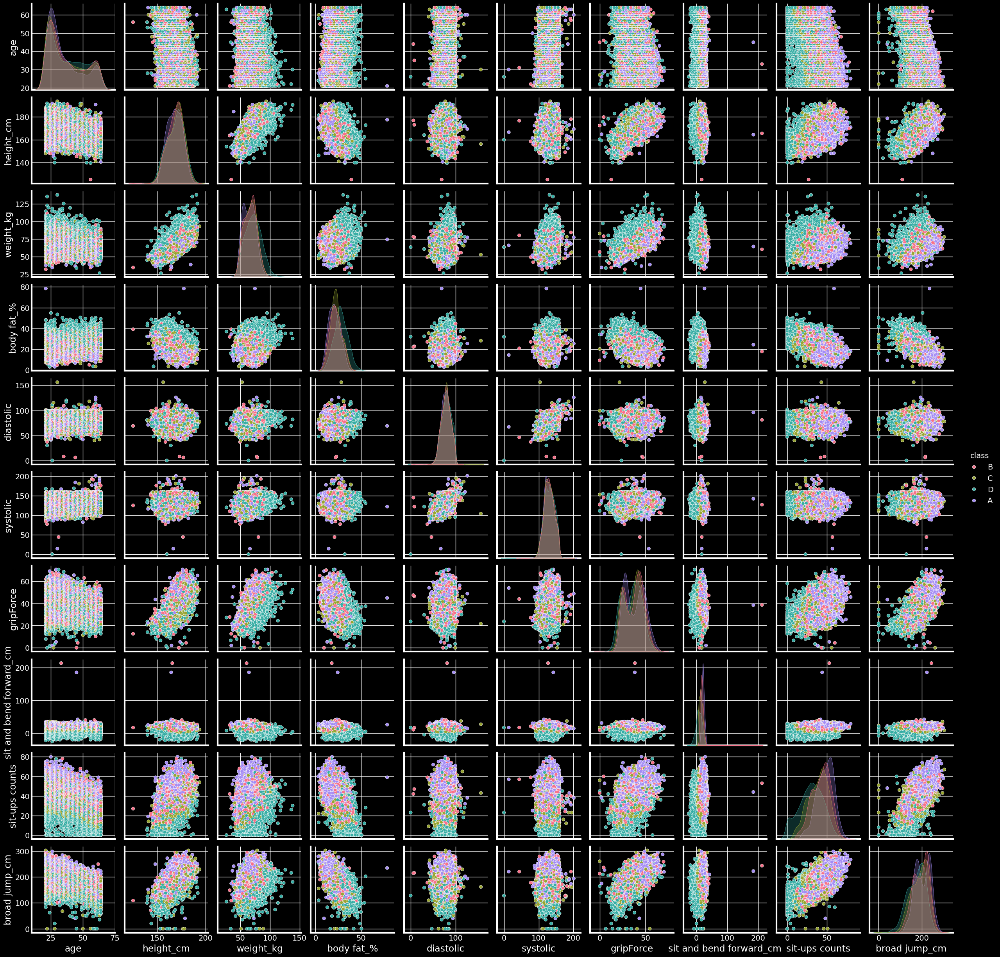

In [35]:
sns.pairplot(dataset, hue="class", palette="husl")

## Data Preprocessing

Splitting Dataset into Features and Labels. Features are independent Variable and Labels are dependentn Variable.

I have Selected Spectral Classes as Dependent Variable and will predict them in next stage.

In [36]:
features = dataset.iloc[:, :-1]
labels = dataset.iloc[:, -1]

## Modelling

### LuciferML

In [37]:
classifier = Classification(predictor=['all'], smote='y', exclude_models=['ridg'])

In [38]:
classifier.fit(features, labels)


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝
 

Started LuciferML [ ✓ ]

Preprocessing Started [*]

Encoding Features [*]

Preprocessing Done [ ✓ ]

Training LuciferML [*]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1744
[LightGBM] [Info] Number of data points in the train set: 10716, number of used features: 12
[LightGBM] [Info] Start training from s

C:\Users\henri\AppData\Roaming\Python\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\henri\AppData\Roaming\Python\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\henri\AppData\Roaming\Python\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\henri\AppData\Roaming\Python\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\henri\AppData\Roaming\Python\Python311\site-pac

Training Done [ ✓ ]

Results Below



,Name,Accuracy,KFold Accuracy,Model
0,Logistic Regression,61.343284,61.841989,LogisticRegression()
1,Stochastic Gradient Descent,55.559701,56.028297,SGDClassifier()
2,Perceptron,48.134328,49.635619,Perceptron()
3,Passive Aggressive Classifier,47.052239,46.080635,PassiveAggressiveClassifier()
4,Support Vector Machine,70.335821,68.486472,SVC()
5,K-Nearest Neighbours,60.970149,59.023606,KNeighborsClassifier()
6,Decision Trees,65.111940,63.988374,DecisionTreeClassifier()
7,Naive Bayes,56.305970,54.488055,GaussianNB()
8,Random Forest Classifier,74.552239,73.142760,"(DecisionTreeClassifier(max_features='sqrt', r..."
9,Gradient Boosting Classifier,72.761194,71.808430,([DecisionTreeRegressor(criterion='friedman_ms...



Completed LuciferML Run [ ✓ ]

Saved Best Model to lucifer_ml_info/best/classifier/models/LightGBM_Classifier_1704390657.pkl and its scaler to lucifer_ml_info/best/classifier/scalers/LightGBM_Classifier_Scaler_1704390657.pkl 

Time Elapsed :  533.01 seconds 



### Best model

In [39]:
classifier.best_classifier.summary()


Best Model Summary:
Name:  LightGBM Classifier
Accuracy:  76.23134328358209
KFold Accuracy:  75.27074013685076




### Tuning best model

In [40]:
classifier = Classification(predictor=['lgbm','cat'], smote='y', tune=True,lgbm_objective='multiclass')

In [41]:
classifier.fit(features,labels)


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝
 

Started LuciferML [ ✓ ]

Preprocessing Started [*]

Encoding Features [*]

Preprocessing Done [ ✓ ]

Training LuciferML [*]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1744
[LightGBM] [Info] Number of data points in the train set: 10716, number of used features: 12
[LightGBM] [Info] Start training from score -1.377006
[LightGBM] [Info] Start training from score -1.38